# Classify architecture type from an image of a home

## Setup

In [4]:
# Need to run `PYTORCH_ENABLE_MPS_FALLBACK=1 jupyter notebook` before loading this notebook
# there is an error that pops up later with augmentation that I couldn't figure out how to change while in the notebook.

# Suppress warnings from PyTorch
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

# fastai V1 library which sits on top of Pytorch 1.0
from fastai.vision import *

import requests

from bs4 import BeautifulSoup

from fastai.vision.all import *
from fastai.vision import *

# import my custom functions
from src.utils import _label_func

import pandas as pd
import matplotlib.pyplot as plt

import os
import sys

# add the 'src' directory as one where we can import modules
src_dir = os.path.join(os.getcwd(), 'src') #os.pardir, 'src')
sys.path.append(src_dir)

%load_ext autoreload
%autoreload 2

# Loading custom functions
from plot_map import find_unique, plot_arch_map, simpson_index, get_blocks, assign_block

import seaborn as sns

# Get color classes for plotting later
prediction_colors = {'bungalow': '#003f5c', 'victorian': '#7a5195', 'prairie': '#ef5675', 'foursquare': '#ffa600'}


## Look at results

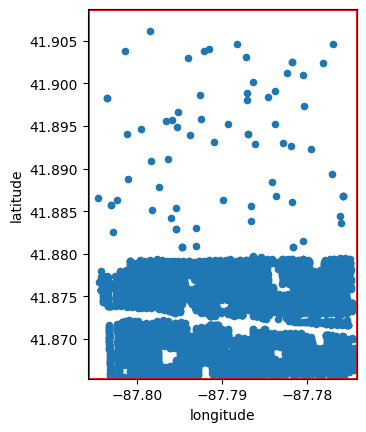

In [247]:
# now I need to find out how to extract data...
# soup.contents

# ok- thinking about this
# according to xx there are 25000 homes in Oak Park
# on redfin, there are ~3000 in last 5 years

# TODO make sure my scraping script is outputting home metadata correctly

# load redfin metadata
rf_metadata = pd.read_csv('data/interim/rf_meta.csv')

# Fill NaN values with a placeholder integer (e.g., -1)
rf_metadata['property_id'] = rf_metadata['property_id'].fillna(-1).astype(int)

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

# Plot the latitude and longitude of the homes
rf_metadata.plot(kind='scatter', x='longitude', y='latitude')

# Draw rectangle for Oak Park
plt.gca().add_patch(plt.Rectangle((uleft[1], lright[0]), lright[1] - uleft[1], uleft[0] - lright[0], 
                                  edgecolor='r', facecolor='none', lw=2))

plt.xlim(min(rf_metadata['longitude'].min(), uleft[1]), max(rf_metadata['longitude'].max(), lright[1]))
plt.ylim(min(rf_metadata['latitude'].min(), lright[0]), max(rf_metadata['latitude'].max(), uleft[0]))

plt.gca().set_aspect('equal', adjustable='box')

## House image classifier

### Image loading setup

In [166]:
# get images for training the model
path = "/Users/chad/github/architecture/images/training"
fnames = get_image_files(path)

len(fnames) # 109 images


109

### Use image augmentation to increase training samples

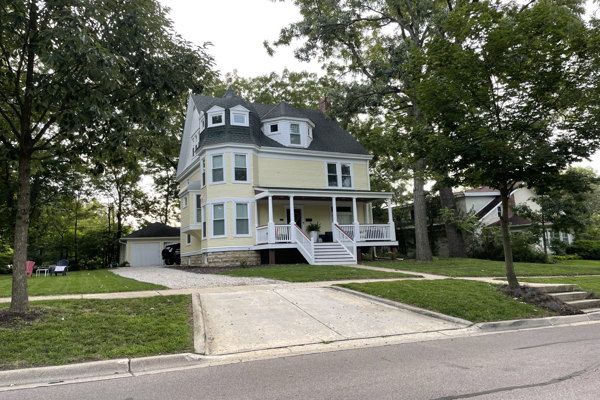

In [167]:
# single image of a house
img = PILImage(PILImage.create(fnames[0]).resize((600,400)))
img

In [168]:
# Setup augmentation transforms of image
# NB: I took these parameters from an existing project on github-
# https://github.com/dumitrux/architectural-style-recognition/blob/master/src/architectural-style-recognition.ipynb
# The get_transforms function is for the old fastai/pytorch versions so now we need to use aug_transforms

tfms = aug_transforms(pad_mode='zeros', mult=2, min_scale=0.75, do_flip=True, flip_vert=False, max_rotate=3, max_zoom=1.1,
                     max_lighting=0.2, max_warp=0.1, p_affine=0.75, p_lighting=0.5)


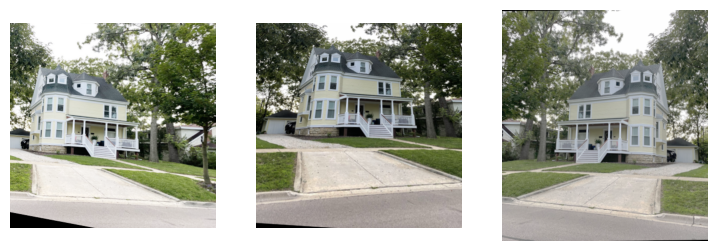

In [169]:
# Visualize the image transformations

from fastai.vision.all import TensorImage

timg = TensorImage(array(img)).permute(2,0,1).float()/255.

def _batch_ex(bs):
    return TensorImage(timg[None].expand(bs, *timg.shape).clone())

# plot some sample transformations
y = _batch_ex(9)
for t in tfms: y = t(y, split_idx=0)
_,axs = plt.subplots(1,3, figsize=(9,3))
for i,ax in enumerate(axs.flatten()): show_image(y[i], ctx=ax)

# save this image to a file
plt.axis('tight')
plt.savefig('reports/figures/warp.jpg')


In [182]:
# this way was using cap letter as labeler
# dls = ImageDataLoaders.from_name_func(path, files, label_func, bs=5, item_tfms=Resize(224), valid_pct=0.2)
# valid_pct is the percent of images used for validation

# this pulls the label from the file name (stuff before _ or -)
# dls = ImageDataLoaders.from_name_re(path, files, pat='^(.*)[_-].*?.jpg', item_tfms=Resize(224), bs=5)

# Set seed for reproducibility
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True

set_seed(42)

# trying datablock instead
# here the subfolder name is used as the label
dblock = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(valid_pct=0.2, seed=44),
                   item_tfms = Resize(224),
                   batch_tfms = tfms)

# does this help anything?
# batch_tfms = aug_transforms(size=224)
# load the data (batch size 5 minimum)
dls = dblock.dataloaders(path, bs=12)

NB: this spits out a pytorch warning, but it seems to work still

In [183]:
# show the data
'train:', len(dls.train.items), 'valid:', len(dls.valid.items)

('train:', 88, 'valid:', 21)

In [184]:
print("Training images:\n", [x.stem for x in dls.train.items], "\n")
print("Validation images:\n", [x.stem for x in dls.valid.items])

Training images:
 ['chicagobungalow4', 'The-Thomas-Wells-House', 'chicagobungalow3', '2449FourSquare', 'YellowFourSquare', '4703-Highland-Ave', 'The-Campbell-House', 'The-Joseph-Moore-House-e1694963944109', 'shutterstock_1263296944', 'forest-ave-4815', '21635476-1', 'main3', 'red-victorian-home-wrap-around-porch-964fcce8-6d2ab8ee6f5b4d79941bd8866d1fb9ec', '5217-Fairmount-Ave-From-Google', 'The-Mitchell-Heintz-House', 'The-Gerardus-J.-Verbeck-House', 'The-Hanson-House', 'The-A.C.-Riddler-House', 'The-Darnley-House', 'CH32FEAWIL_LuxeDryED_0110-fit=constrain&wid=2560&hei=1440', 'portland-foursquare-home', 'GettyImages-165432736-scaled', 'The-Ella-Beaudette-House-gray', 'abf48490bbdb4d68efe381f71b11336b', 'chicagobungalow5', 'Maple-Ave-1323-2', 'The-Reideler-House', '701-maple-ave-herring-house', '710-maple-ave-cole-house', 'framebungalow', 'chicagobungalow8', 'XL_11792_bigrock_winter07', 'what-is-a-bungalow', 'prairie_751ClintonPl', 'IMG_4992-scaled', 'victorian-home_window-world-hero_198

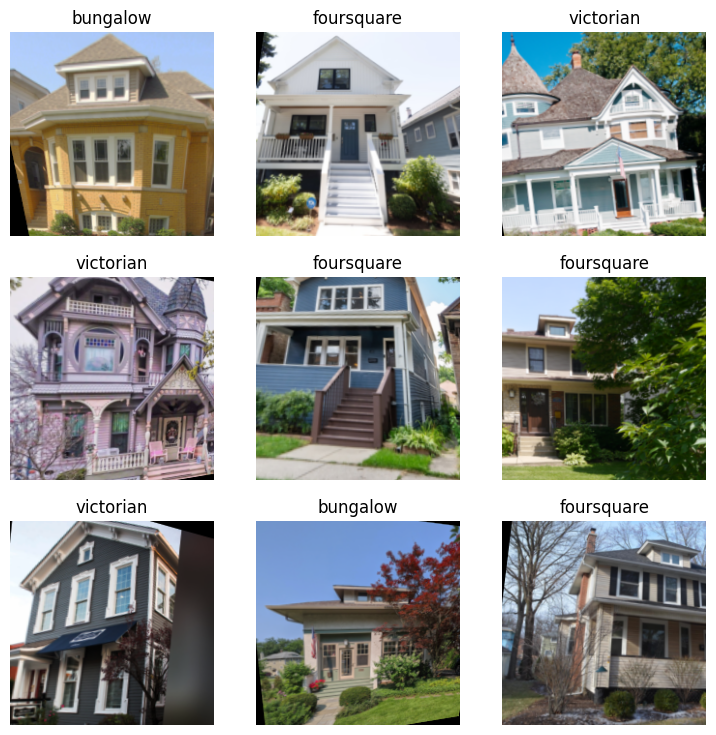

In [185]:
dls.show_batch()

In [186]:
# train the model
learn = vision_learner(dls, resnet34, metrics=error_rate)
# NB this was using ~6 cores on my local machine (macbook)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=de

SuggestedLRs(valley=0.0014454397605732083)

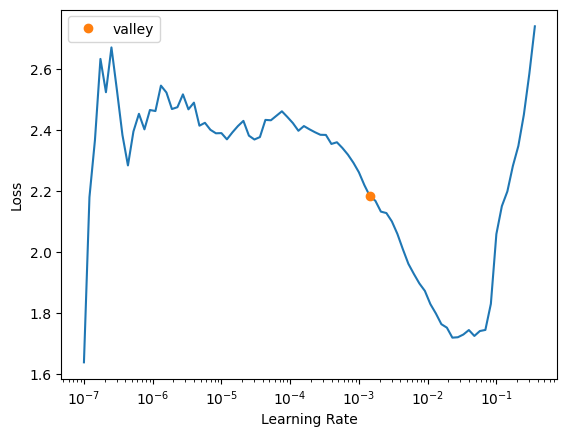

In [187]:
# ?? find optimal parameters for fine-tuning the model
# Find optimal learning rate
learn.lr_find()

In [188]:
# fine tune the learner
import random
import numpy as np

learn.fine_tune(10, 0.001445)

epoch,train_loss,valid_loss,error_rate,time
0,2.200075,1.857549,0.666667,00:05


epoch,train_loss,valid_loss,error_rate,time
0,1.982994,1.479598,0.714286,00:05
1,1.732090,1.157779,0.476190,00:05
2,1.464522,0.803044,0.380952,00:05
3,1.270788,0.543042,0.238095,00:05
4,1.145952,0.458216,0.095238,00:05
5,0.996379,0.386944,0.095238,00:05
6,0.840031,0.405007,0.190476,00:05
7,0.726453,0.396496,0.142857,00:05
8,0.653453,0.405453,0.095238,00:05
9,0.618734,0.413774,0.095238,00:05


Getting pretty decent performance (>85% accuracy) with only this 110+ image set

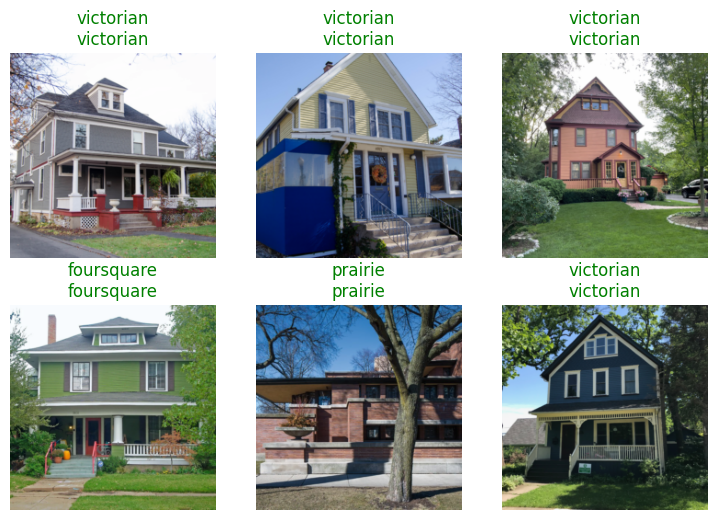

In [189]:
learn.show_results(max_n=6)
plt.savefig('reports/figures/learn_results.png')

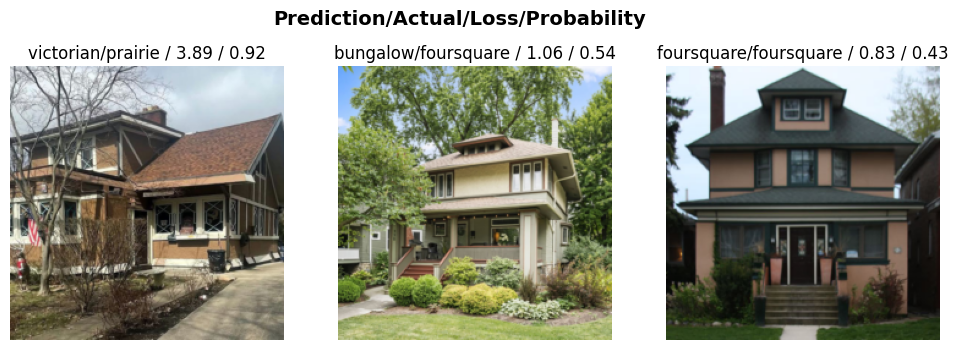

In [190]:
# find the images that give the most problems
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(3, figsize=(12,4))

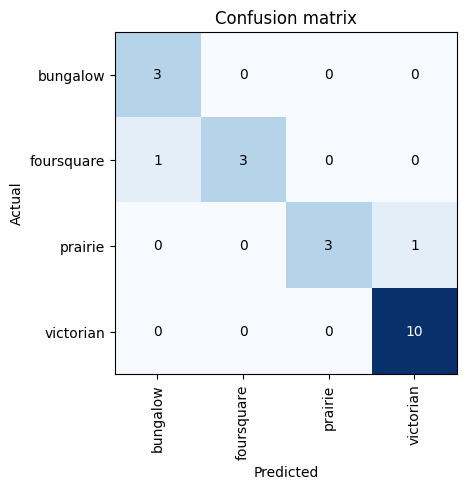

In [191]:
# look at confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
plt.savefig('reports/figures/confusion_matrix.png')

From this, we can see that bungalows, foursquares, and prairie-style homes all kind of blend together.

### Save and reload the final model

In [192]:
# learn.save('architecture_model')
# learn.load('architecture_model')

Path('models/architecture_model.pth')

## Predicting home types

### Using the trained model to predict house type from Redfin images

In [193]:
import os
import pandas as pd
from tqdm.notebook import tqdm

# Get list of file paths to the test images
test_images = get_image_files('images/testing')

df_preds = pd.DataFrame(columns=['image', 'prediction', 'probability'])

# Load and predict on each test image
for i in tqdm(range(len(test_images))):
    img_path = test_images[i]
    img = PILImage.create(img_path)
    pred, _, probs = learn.predict(img)
    # Get the basename of the first test image path
    nm = os.path.basename(img_path)
    # Selecting top prediction based on max probability (e.g., `.max().item()`)
    df = pd.DataFrame({'image': nm, 'prediction': pred, 'probability': probs.max().item()}, index=[0])
    df_preds = pd.concat([df_preds, df])

# Get the property ID from the image name
df_preds['pid'] = df_preds['image'].str.extract(r'pid(\d+)', expand=False)

# Convert property ID to integer
df_preds['pid'] = df_preds['pid'].astype(int)

  0%|          | 0/4297 [00:00<?, ?it/s]

array([[<Axes: title={'center': 'probability'}>]], dtype=object)

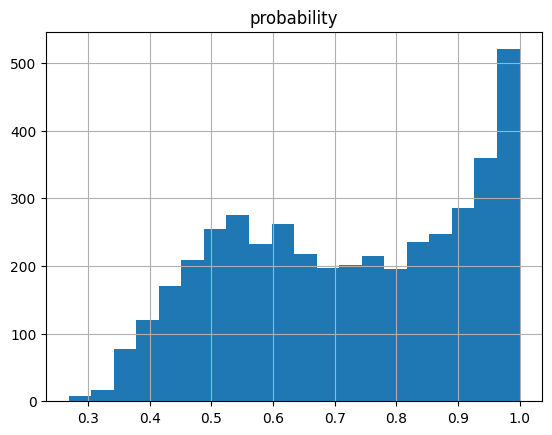

In [194]:
# Look at the distribution of probabilities across all predictions
df_preds.hist(column='probability', bins=20)

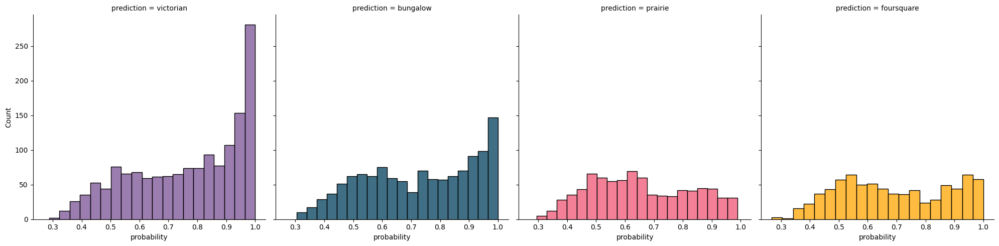

In [195]:
# Look at probabilities for home styles individually
g = sns.FacetGrid(data=df_preds, col='prediction', col_wrap=4, height=5, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'probability', bins=20, kde=False)
plt.savefig('reports/figures/probability_hist.png')

In [196]:
# Save prediction dataset
df_preds.to_csv('data/interim/rf_predictions.csv', index=False)

## Data preprocessing

### Load interim rf metadata

In [197]:
# Load interim dataset
rf_metadata = pd.read_csv('data/interim/rf_meta_year_updated.csv')

# Filter out homes that are not single-family
rf_metadata = rf_metadata[rf_metadata['home_type'] == 'Single-family']

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

### Merge with predictions and save final dataset

NB: only run this if files have changed

In [198]:
# Extract the relevant part of the image name using regex
# df_preds['extracted'] = df_preds['image'].str.extract(r'(\d+-\w+-\w+-\w+)', expand=False)
# df_preds['extracted'].values[0]

df_preds = pd.read_csv('data/interim/rf_predictions.csv')

df_merged = df_preds.merge(rf_metadata, left_on='pid', right_on='property_id')

df_merged.to_csv('data/processed/rf_predictions.csv', index=False)


### Load final dataset

In [199]:
df_merged = pd.read_csv('data/processed/rf_predictions.csv')


In [200]:
# Look at counts of predictions
df_merged['prediction'].value_counts()
# Most common is victorian- does that make sense?

prediction
victorian     1267
bungalow      1070
foursquare     660
prairie        637
Name: count, dtype: int64

## Visualizations

### Plot roads

<Axes: >

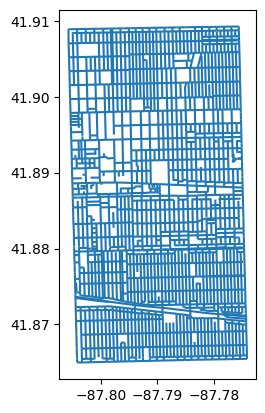

In [9]:
# Load roads database

import geopandas as gpd

# Import all roads NL
map_df = gpd.read_file('data/raw/roads/Street_Centerlines.shp')

# Convert from meters to lat/long
map_df = map_df.to_crs(epsg=4326)
map_df.plot()

### Mapping alpha-diversity of architectural styles
In this section, we will create a heatmap plot to visualize the density of different architectural styles in Oak Park, IL. This type of plot helps in understanding the spatial distribution and density of various house types in the area. Note: I am using the concept of alpha diversity borrowed from the field of ecology. The idea is that in a given 30m radius, diversity is the number of unique home styles in that area.

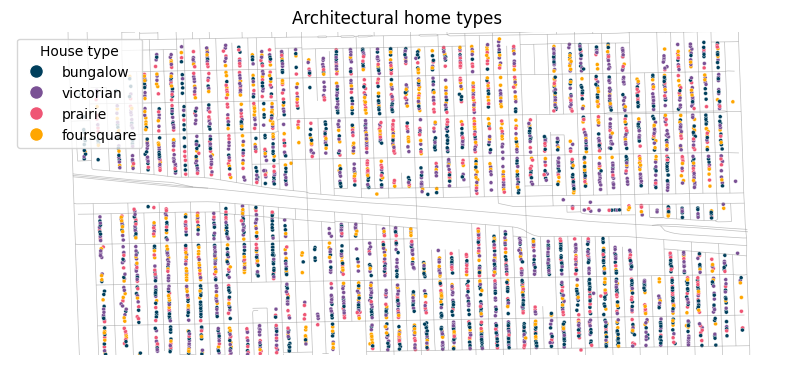

In [201]:
# Create unique home in radius column
df_merged['unique_homes_in_radius'] = find_unique(df_merged, radius=0.0002)  # .0001 is about 10 meters

# Plot only home types
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural home types',
              file_name='reports/figures/arch_div_p00_r20_noHM.png',
              heatmap=False, road_col='gray')


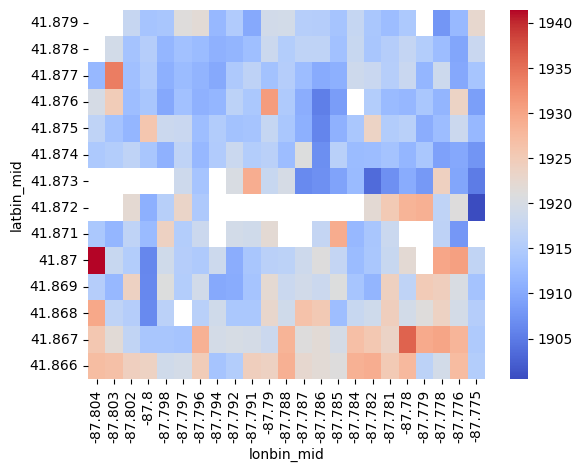

In [202]:

# This was something I was trying that creates a buffer around each home
# For smoothing over the exact location of each home
# gdf = gpd.GeoDataFrame(df_merged, geometry=gpd.points_from_xy(df_merged.longitude, df_merged.latitude))
# help(gdf.resample)
# gdf.buf = gdf.buffer(0.0005)

df = df_merged.copy()

# Filter out homes that are not in the target zip code
df = df[df['latitude'] < 41.88]

# Set the resolution of the heatmap
RESO = 25

fig, ax = plt.subplots(1, 1)

df['latbin'] = pd.cut(df['latitude'], bins=RESO)
df['lonbin'] = pd.cut(df['longitude'], bins=RESO)
df['latbin_mid'] = round(df['latbin'].apply(lambda x: x.mid).astype(float), 3)
df['lonbin_mid'] = round(df['lonbin'].apply(lambda x: x.mid).astype(float), 3)

df2 = df.groupby(['latbin_mid', 'lonbin_mid'])['year_built'].mean().unstack()
df2.sort_index(ascending=False, inplace=True)

sns.heatmap(df2, cmap='coolwarm', annot=False, ax=ax)
plt.savefig('reports/figures/heatmap.png')

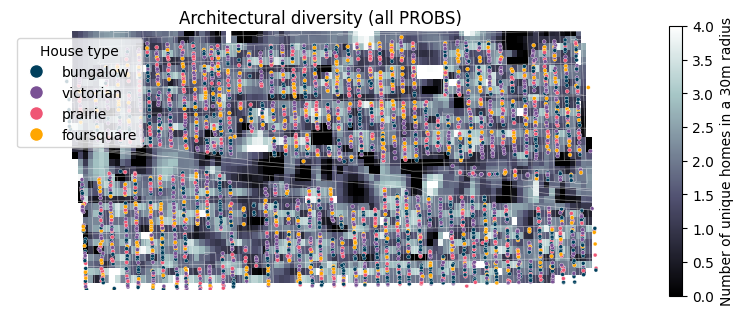

In [203]:
# Add in diversity layer
plot_arch_map(df=df_merged, cols=prediction_colors,
              plot_title='Architectural diversity (all PROBS)',
              file_name='reports/figures/arch_div_p00_r20.png',
              cmap='bone')

### Segment street blocks

/Users/chad/github/architecture/env/lib/python3.10/site-packages/momepy/utils.py:352: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


,geometry,size
0,"POLYGON ((-87.80240 41.89974, -87.80241 41.89988, -87.80242 41.90041, -87.80245 41.90129, -87.80246 41.90157, -87.80220 41.90157, -87.80137 41.90159, -87.80094 41.90159, -87.80092 41.90102, -87.80091 41.90046, -87.80090 41.90011, -87.80089 41.89977, -87.80128 41.89976, -87.80215 41.89975, -87.80240 41.89974))",0.000003
1,"POLYGON ((-87.80246 41.90157, -87.80245 41.90129, -87.80242 41.90041, -87.80241 41.89988, -87.80240 41.89974, -87.80282 41.89974, -87.80347 41.89973, -87.80392 41.89972, -87.80393 41.89999, -87.80396 41.90067, -87.80398 41.90142, -87.80398 41.90154, -87.80371 41.90155, -87.80295 41.90156, -87.80246 41.90157))",0.000003
2,"POLYGON ((-87.80392 41.89972, -87.80347 41.89973, -87.80282 41.89974, -87.80240 41.89974, -87.80239 41.89944, -87.80237 41.89859, -87.80236 41.89839, -87.80234 41.89792, -87.80258 41.89791, -87.80304 41.89791, -87.80337 41.89790, -87.80363 41.89789, -87.80386 41.89789, -87.80390 41.89904, -87.80392 41.89959, -87.80392 41.89972))",0.000003
3,"POLYGON ((-87.80240 41.89974, -87.80215 41.89975, -87.80128 41.89976, -87.80089 41.89977, -87.80088 41.89952, -87.80086 41.89890, -87.80084 41.89842, -87.80159 41.89840, -87.80236 41.89839, -87.80237 41.89859, -87.80239 41.89944, -87.80240 41.89974))",0.000002
4,"POLYGON ((-87.80246 41.90157, -87.80247 41.90179, -87.80249 41.90235, -87.80251 41.90299, -87.80253 41.90341, -87.80216 41.90341, -87.80176 41.90342, -87.80128 41.90343, -87.80100 41.90343, -87.80100 41.90327, -87.80097 41.90240, -87.80095 41.90179, -87.80094 41.90159, -87.80137 41.90159, -87.80220 41.90157, -87.80246 41.90157))",0.000003


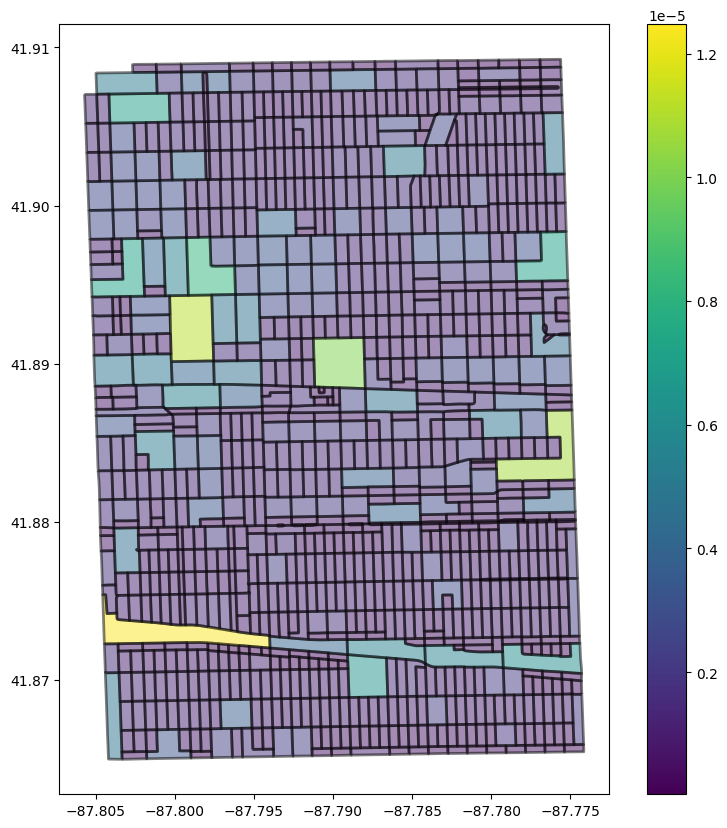

In [11]:
# Import roads shape files as a GeoDataFrame
blocks = get_blocks(shapefile = 'data/raw/roads/Street_Centerlines.shp', plot=True)
blocks.head()

In [204]:
# Assign each house to a block
df_merged['block'] = df_merged.apply(lambda x: assign_block((x['longitude'], x['latitude']), blocks), axis=1)

In [205]:
# Calculate the Simpson index for each block
df_merged['simpson'] = df_merged['prediction'].groupby(df_merged['block']).transform(simpson_index)

In [206]:
# Find a particular home
df_merged[df_merged['block'] == 203].head()

# Find a particular home address by fuzzy search
# df_merged[df_merged['match'].str.contains('613')]


,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,year_built,lot_size,price,beds,baths,sqft,in_oak_park,unique_homes_in_radius,block,simpson
46,601-S-Grove-Ave_pid13249170.jpg,prairie,0.498100,13249170,601 S GROVE AV,601 S Grove Ave,13249170,41.878190,-87.795656,/IL/Oak-Park/601-S-Grove-Ave-60304/home/13249170,...,1920.0,4950.0,NaN,4.0,2.0,2121.0,1,2,203,0.740484
791,634-Carpenter-Ave_pid13249334.jpg,prairie,0.657640,13249334,634 CARPENTER AVE,634 Carpenter Ave,13249334,41.877094,-87.796011,/IL/Oak-Park/634-Carpenter-Ave-60304/home/13249334,...,1914.0,6373.0,NaN,3.0,2.0,1793.0,1,1,203,0.740484
1065,629-S-Grove-Ave_pid13249204.jpg,bungalow,0.936457,13249204,629 S GROVE,629 S Grove Ave,13249204,41.877207,-87.795603,/IL/Oak-Park/629-S-Grove-Ave-60304/home/13249204,...,1912.0,5000.0,NaN,3.0,1.0,1140.0,1,2,203,0.740484
1081,621-S-Grove-Ave_pid13249535.jpg,victorian,0.441404,13249535,621 S GROVE AVE,621 S Grove Ave,13249535,41.877516,-87.795605,/IL/Oak-Park/621-S-Grove-Ave-60304/home/13249535,...,1909.0,5000.0,625000.0,3.0,2.0,NaN,1,2,203,0.740484
1154,606-Carpenter-Ave_pid13249335.jpg,foursquare,0.592060,13249335,606 CARPENTER,606 Carpenter Ave,13249335,41.877987,-87.796002,/IL/Oak-Park/606-Carpenter-Ave-60304/home/13249335,...,1911.0,3600.0,NaN,4.0,1.0,1404.0,1,3,203,0.740484


<Axes: xlabel='simpson', ylabel='Count'>

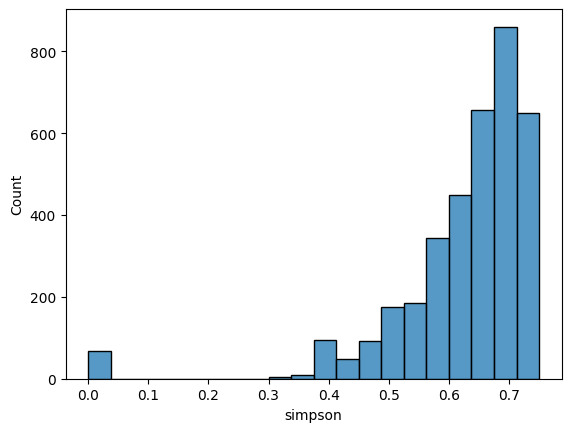

In [207]:
# Plot a histogram of the Simpson index
sns.histplot(df_merged['simpson'], bins=20)

<Axes: xlabel='longitude', ylabel='latitude'>

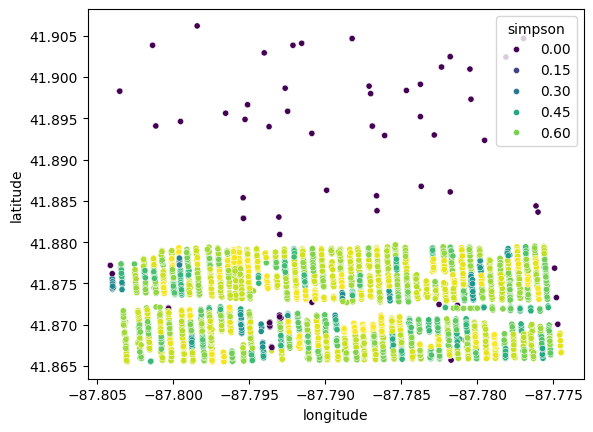

In [208]:
# Plot the blocks with colors corresponding to the Simpson index
sns.scatterplot(data=df_merged, x='longitude', y='latitude', hue='simpson', palette='viridis', s=20)

,simpson,home_value,year_built,latitude,longitude
simpson,1.000000,-0.023189,-0.025532,-0.247783,-0.014346
home_value,-0.023189,1.000000,0.018910,0.155593,-0.168018
year_built,-0.025532,0.018910,1.000000,-0.132466,0.018887
latitude,-0.247783,0.155593,-0.132466,1.000000,0.011332
longitude,-0.014346,-0.168018,0.018887,0.011332,1.000000


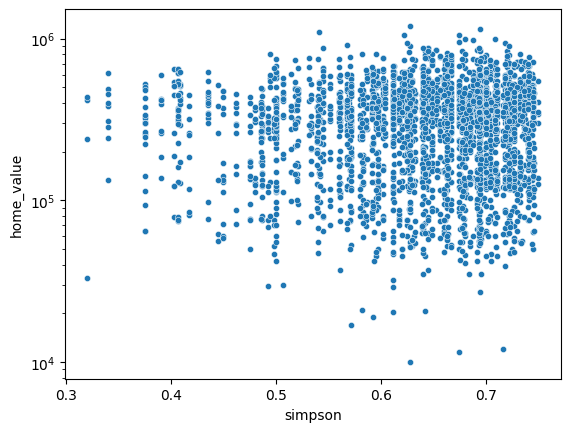

In [209]:
# Plot home values and Simpson index
g = sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='home_value', s=20)
g.set_yscale('log')

# Is this relationship significant?

# Calculate the correlation between the Simpson index and home value
df_merged[['simpson', 'home_value', 'year_built', 'latitude', 'longitude']].corr()

# sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='latitude', s=20)

# Prob not, but the correlation matrix shows that latitude and simpson index are strongly correlated (-0.25)


<Axes: xlabel='year_built', ylabel='simpson'>

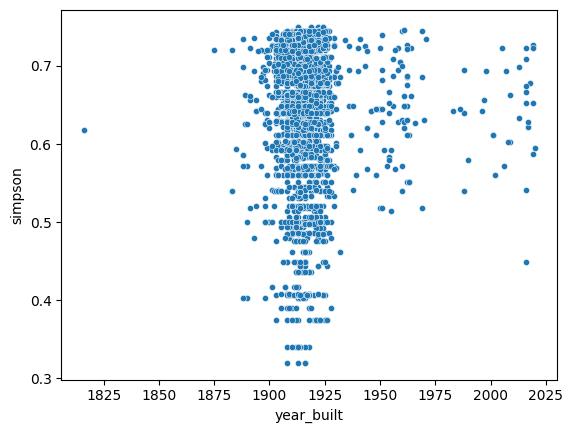

In [210]:
# Plot the Simpson index against the year built
sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)],
                x='year_built', y='simpson', s=20)

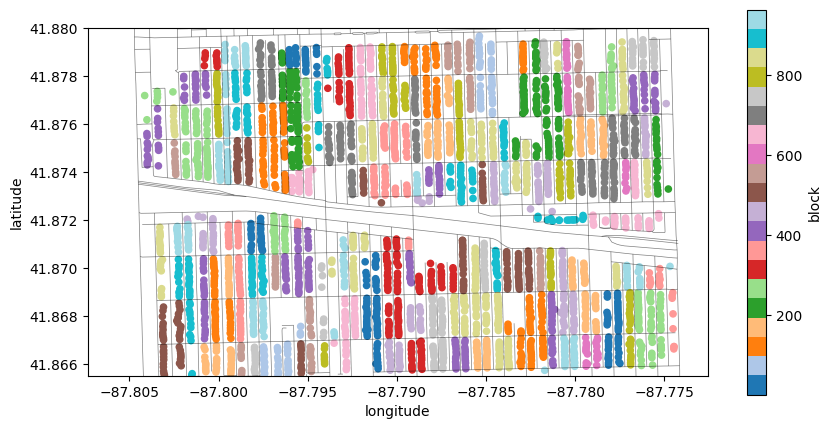

In [211]:
# Plot the blocks with colors corresponding to the block each house is in
fig, ax = plt.subplots(figsize=(10, 5))

df_merged.plot('longitude', 'latitude', kind='scatter', c='block', cmap='tab20', ax=ax)

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)

plt.savefig('reports/figures/blocks.png')

### Create map of Simpson index by block

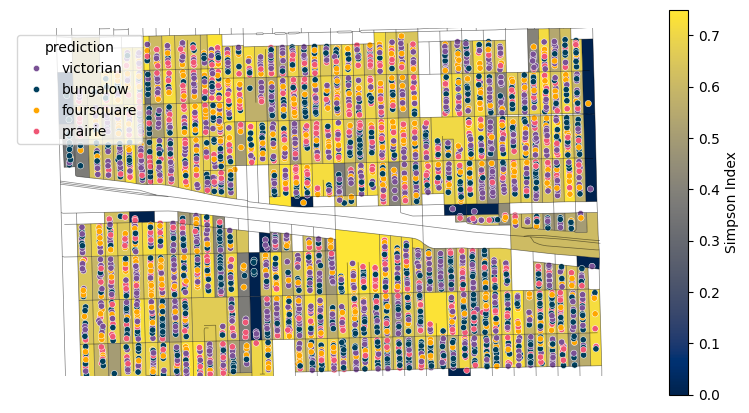

In [212]:
blocks.index.name = 'blockID'

simp_ind = df_merged.groupby('block')['simpson'].mean()

blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]

fig, ax = plt.subplots(figsize=(10, 5))

blocks2.plot(column='simpson', ax=ax, cmap='cividis')

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)

sns.scatterplot(df_merged, x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)

# Add color scale bar
sm = plt.cm.ScalarMappable(cmap='cividis', norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')

ax.set_axis_off()

# Save the figure
plt.savefig('reports/figures/simpson_index.png')

### Trying some different probability cutoffs

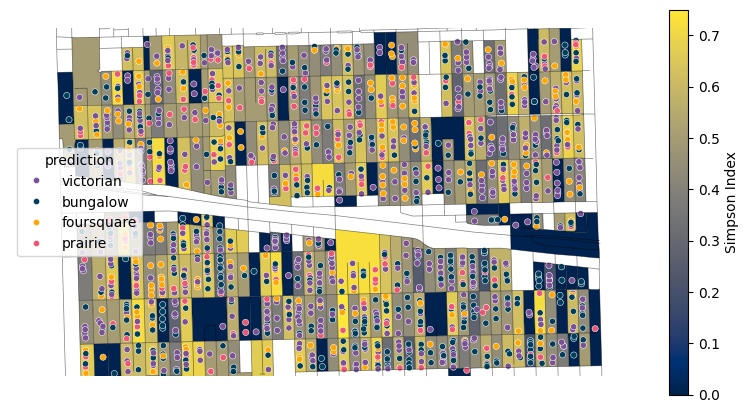

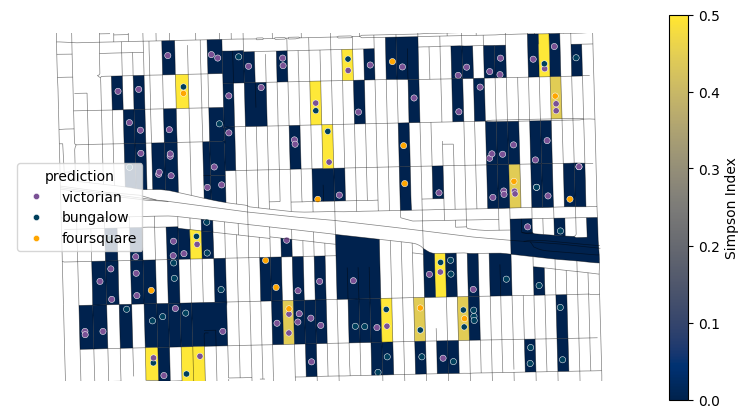

In [213]:
blocks.index.name = 'blockID'

PALETTE = 'cividis'

# Plot blocks with medium-high probability (>80%)
PROB_CUTOFF = 0.8
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')


# Plot blocks with very-high probability (>80%)
PROB_CUTOFF = 0.99
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')



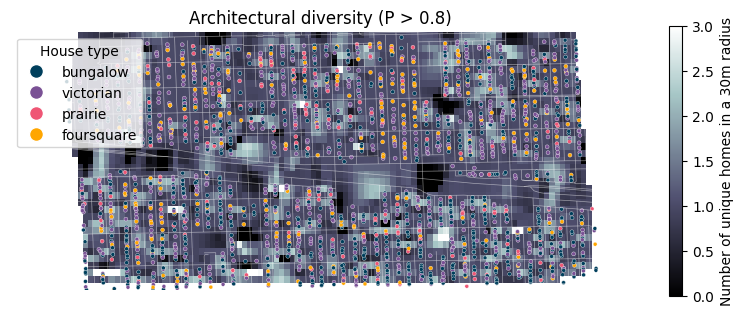

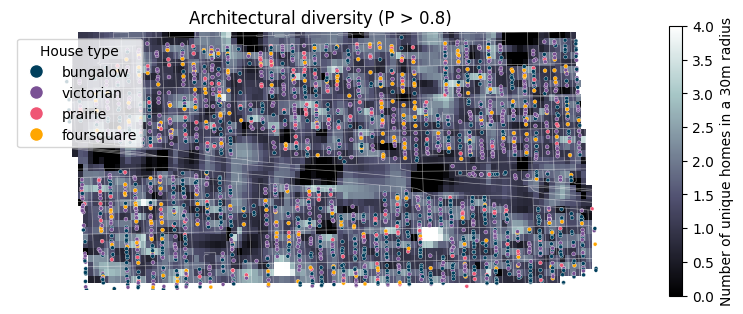

In [273]:
# Create a new column for number of unique homes in a given radius
df_merged['unique_homes_in_radius'] = float('nan')

# Subset the data frame to include only high confidence predictions
idx = df_merged['probability'] > 0.8
plot_df = df_merged[idx]

# Plot with 10m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0001)  # .0001 is about 10 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r10.png')

# Plot with 20m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0002)  # .0002 is about 20 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r20.png')


### More plots

<Axes: xlabel='prediction', ylabel='home_value'>

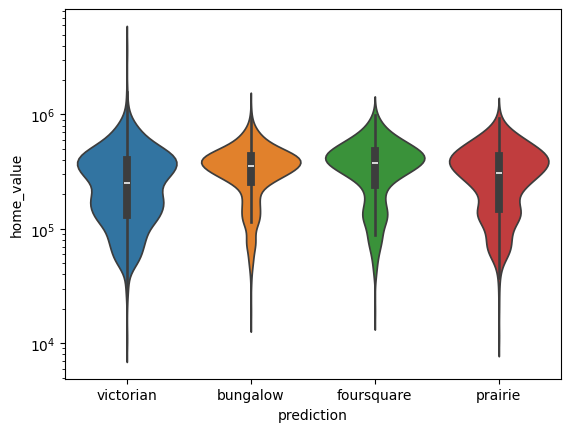

In [214]:
sns.violinplot(data=df_merged, x='prediction', y='home_value', hue='prediction', legend=False, log_scale=True)

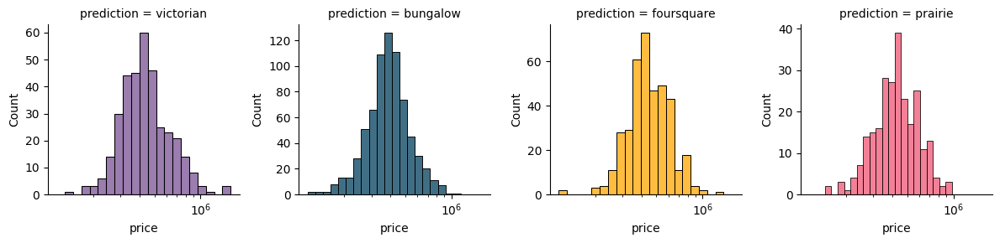

In [216]:
# Plot histograms of home values for each prediction
g = sns.FacetGrid(df_merged, col='prediction', col_wrap=4, sharey=False, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'price', bins=20, log_scale=True)

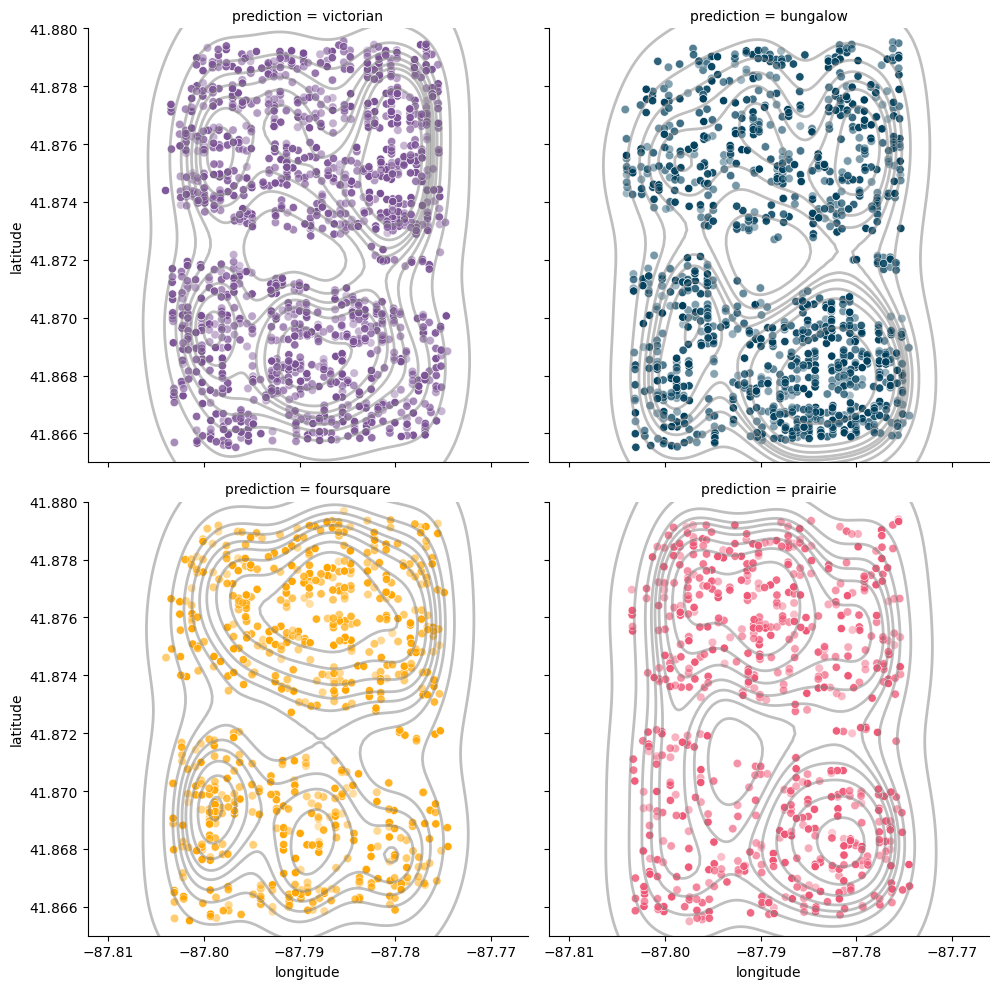

In [217]:
# Plot the distribution of different architectural home styles

g = sns.FacetGrid(df_merged, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.scatterplot, 'longitude', 'latitude', alpha=df_merged['probability'])
g.map(sns.kdeplot, 'longitude', 'latitude', levels=10, color='gray', linewidths=2, alpha=0.5)

g.set(ylim=(41.865, 41.88))


## Regressions

In [218]:
df_merged['home_value'].notna().sum()
# 3141 single-family homes have home values.. cool

3141

In [219]:
# Create dummy variables for logistic regression models
df_merged[['bungalow','foursquare','prairie','victorian']] = pd.get_dummies(df_merged['prediction'])

<Axes: xlabel='latitude', ylabel='foursquare'>

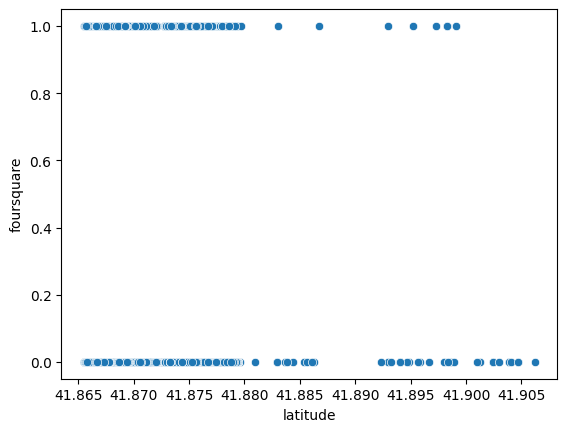

In [220]:
sns.scatterplot(data=df_merged, x='latitude', y='foursquare')
# sns.scatterplot(data=df_merged, x='latitude', y='prairie')
# plt.xscale('log')

### Logistic regression

In [221]:
from sklearn import linear_model

df_drop = df_merged.dropna(subset=['longitude','latitude','foursquare','home_value'])

y = df_drop['foursquare']
X = df_drop[['latitude']]

logr = linear_model.LogisticRegression(verbose=1)

logr.fit(X,y)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.32842D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      6      9      1     0     0   2.620D-06   4.755D-01
  F =  0.47553316819818059     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


LogisticRegression(verbose=1)

In [222]:
# Output model summary stats
odds = np.exp(logr.coef_)
print(odds)

# logr.coef_
# dir(logr)
logr.get_params()


[[0.96488043]]


{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 1,
 'warm_start': False}

### Linear regression

n= 3141 features
r= -0.16 p= 0.0


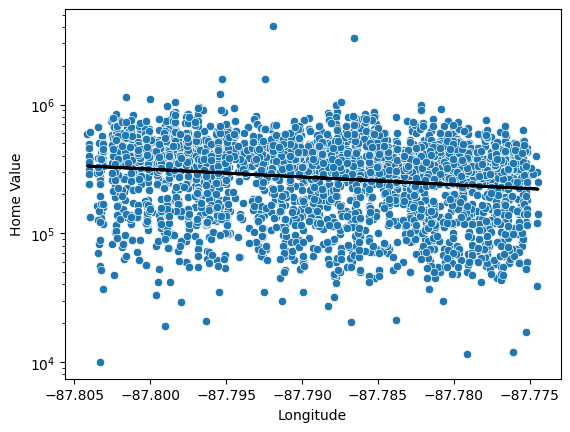

In [223]:
from scipy import stats

sns.scatterplot(data=df_merged, x='longitude', y='home_value')
# sns.scatterplot(data=df_merged, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

df_drop = df_merged.dropna(subset=['longitude','home_value'])

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# r = -0.15, P < 0.001
# there is a negative correlation between longitude and home value
# as we get further from the city (Chicago) center, home values INCREASE

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='black', linewidth=2)
plt.xlabel('Longitude')
plt.ylabel('Home Value')

plt.savefig('reports/figures/home_value_regression.png')

(1890.0, 1940.0)

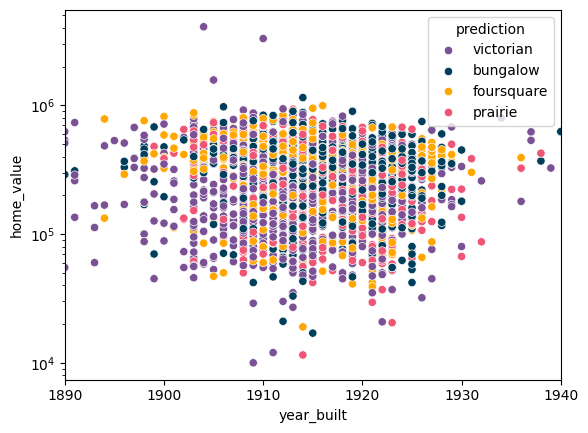

In [224]:
# Plot home value by year built
sns.scatterplot(data=df_merged, x='year_built', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')
plt.xlim(1890, 1940)

In [225]:
# Find home with highest value
df_merged.loc[df_merged['home_value'].idxmax()]
# OK this isn't right. But it is probably a victorian (or maybe foursquare) home


image                                                                737-Wesley-Ave_pid13249690.jpg
prediction                                                                                victorian
probability                                                                                0.978824
pid                                                                                        13249690
input                                                                                737 WESLEY AVE
match                                                                                737 Wesley Ave
property_id                                                                                13249690
latitude                                                                                  41.874797
longitude                                                                                -87.791904
search_url                                          /IL/Oak-Park/737-Wesley-Ave-60304/home/13249690


In [226]:
df_merged['year_built'].min(), df_merged['year_built'].max()
# 2020? let's see about that...

(1816.0, 2020.0)

In [227]:
df_merged[df_merged['year_built'] == 2020]
# might be right.
# looks pretty modern

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,baths,sqft,in_oak_park,unique_homes_in_radius,block,simpson,bungalow,foursquare,prairie,victorian
450,1159-Lyman-Ave_pid13250217.jpg,foursquare,0.421912,13250217,1159 LYMAN AVE,1159 Lyman Ave,13250217,41.866815,-87.776979,/IL/Oak-Park/1159-Lyman-Ave-60304/home/13250217,...,3.5,NaN,1,2,783,0.595041,False,True,False,False


In [228]:
# Convert year to an integer
df_merged['year_built'] = df_merged['year_built'].astype(int)

# Get unique years for animating plot
YEARS = sorted(df_merged['year_built'].unique())
YEARS[0:5]

[1816, 1875, 1883, 1884, 1885]

In [217]:
# Make an animated plot

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(5,3)

ax.axis('off')

map_df.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

def animate(i):
    # ax.clear()
    # Get the point from the points list at index i
    pts = df_merged[df_merged['year_built'] == YEARS[i]]

    # Plot that point using the x and y coordinates
    for pred in prediction_colors.keys():
        subset = pts[pts['prediction'] == pred]
        ax.plot(subset['longitude'], subset['latitude'], color=prediction_colors[pred], label=pred, marker='o', linestyle='None', markersize=2)

    ax.set_title(f'Year: {YEARS[i]}')

    # Set the x and y axis to display a fixed range
    ax.set_xlim(df_merged['longitude'].min(), df_merged['longitude'].max())
    ax.set_ylim(df_merged['latitude'].min(), 41.88)

ani = FuncAnimation(fig, animate, frames=len(YEARS), interval=100, repeat=False)
plt.close()

# Save the animation as an animated GIF
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

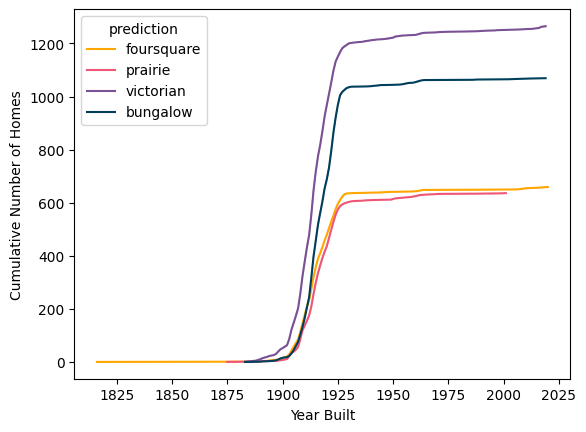

In [229]:
# Sort dataframe by year built
df_merged.sort_values(by='year_built', ascending=True, inplace=True)

# Count the cumulative number of homes grouped by prediction (home style)
df_merged['cumsum_year'] = df_merged.groupby('prediction')['year_built'].cumcount()

sns.lineplot(data=df_merged, x='year_built', y='cumsum_year', hue='prediction', palette=prediction_colors)
plt.xlabel('Year Built')
plt.ylabel('Cumulative Number of Homes')
plt.savefig('reports/figures/cumsum_year.png')

## Multiple regression for home values

In [235]:
df_merged = df_merged.sort_index()
df_merged


,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,in_oak_park,unique_homes_in_radius,block,simpson,bungalow,foursquare,prairie,victorian,cumsum_year,density
0,1019-Highland-Ave_pid13251221.jpg,victorian,0.963230,13251221,1019 HIGHLAND AV,1019 Highland Ave,13251221,41.870135,-87.781963,/IL/Oak-Park/1019-Highland-Ave-60304/home/13251221,...,1,2,560,0.648438,False,False,False,True,647,43
1,1040-S-Taylor-Ave_pid13251489.jpg,bungalow,0.866380,13251489,1040 S TAYLOR,1040 S Taylor Ave,13251489,41.869238,-87.777672,/IL/Oak-Park/1040-S-Taylor-Ave-60304/home/13251489,...,1,2,835,0.580000,True,False,False,False,38,36
2,1167-S-Taylor-Ave_pid13251174.jpg,bungalow,0.934836,13251174,1167 S TAYLOR AVE,1167 S Taylor Ave,13251174,41.866586,-87.778146,/IL/Oak-Park/1167-S-Taylor-Ave-60304/home/13251174,...,1,2,31,0.486111,True,False,False,False,3,33
3,610-Clarence-Ave_pid13248712.jpg,victorian,0.531667,13248712,610 CLARENCE AV,610 Clarence Ave,13248712,41.877530,-87.790208,/IL/Oak-Park/610-Clarence-Ave-60304/home/13248712,...,1,2,792,0.674556,False,False,False,True,838,35
4,732-S-Taylor-Ave_pid13252072.jpg,bungalow,0.923018,13252072,732 S TAYLOR AVE,732 S Taylor Ave,13252072,41.875122,-87.777870,/IL/Oak-Park/732-S-Taylor-Ave-60304/home/13252072,...,1,2,687,0.601562,True,False,False,False,574,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3629,832-Highland-Ave_pid13250800.jpg,prairie,0.673769,13250800,832 HIGHLAND AV,832 Highland Ave,13250800,41.873276,-87.781535,/IL/Oak-Park/832-Highland-Ave-60304/home/13250800,...,1,3,442,0.693878,False,False,True,False,111,35
3630,727-S-Cuyler-Ave_pid13252693.jpg,bungalow,0.514743,13252693,727 S CUYLER,727 S Cuyler Ave,13252693,41.875298,-87.783350,/IL/Oak-Park/727-S-Cuyler-Ave-60304/home/13252693,...,1,2,226,0.708333,True,False,False,False,328,29
3631,224-Flournoy-St_pid13251419.jpg,prairie,0.595499,13251419,224 FLOURNOY,224 Flournoy St,13251419,41.871993,-87.780450,/IL/Oak-Park/224-Flournoy-St-60304/home/13251419,...,1,2,890,0.620000,False,False,True,False,574,13
3632,1159-S-Scoville-Ave_pid13245651.jpg,bungalow,0.922396,13245651,1159 S SCOVILLE,1159 S Scoville Ave,13245651,41.866664,-87.787984,/IL/Oak-Park/1159-S-Scoville-Ave-60304/home/13245651,...,1,3,742,0.611111,True,False,False,False,1059,47


<Axes: xlabel='simpson', ylabel='Count'>

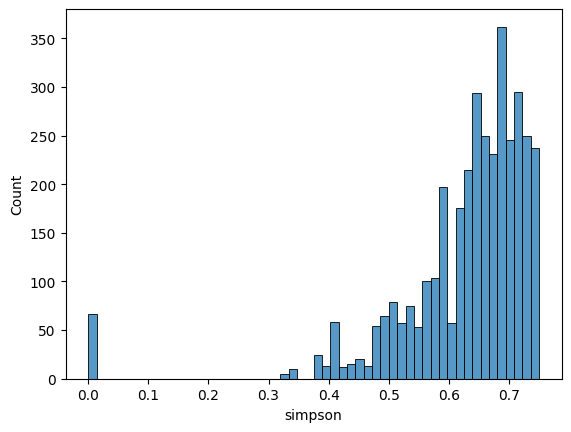

In [272]:
# Adding NND of homes in a ~100m (block) radius
df_merged['density'] = find_unique(df_merged, radius=0.001, stratify=False)  # .001 is about 100 meters (1 block)

# Unique homes with 20m
df_merged['unique_home_styles'] = find_unique(df_merged, radius=0.0002, stratify=True)  # .0002 is about 20 meters

# sns.histplot(df_merged['unique_home_styles'])
sns.histplot(df_merged['simpson'])

In [237]:
# Plotting
import seaborn as sns

# Dropping outliers (60 bedrooms haha)
df_merged = df_merged[df_merged['beds'] < 10]

corrmat = df_merged[['sqft', 'beds', 'baths', 'price', 'lot_size', 'density', 'year_built']].corr()

# Get top 3 strongest correlations
corrmat.abs().unstack().sort_values(ascending=False).drop_duplicates().nlargest(5)


sqft   sqft     1.000000
       price    0.736678
baths  sqft     0.666300
price  baths    0.646264
beds   sqft     0.638912
dtype: float64

In [529]:
# Pairs plot of square footage, beds, baths, and price
df_merged['rel_sqft'] = df_merged['sqft'] / df_merged['lot_size']
df_merged.replace([np.inf, -np.inf], np.nan, inplace=True)

df = df_merged[(df_merged['home_value'] < 2e6) & (df_merged['lot_size'] > 0) & (df_merged['simpson'] > 0)]

print(len(df))

sns.pairplot(df, vars=['price','sqft','baths','beds','longitude','simpson'])
# sns.pairplot(df, vars=['home_value','sqft','baths','beds','lot_size','year_built','longitude','latitude','simpson'], hue='prediction', palette=prediction_colors)
# help(sns.pairplot)

plt.savefig('reports/figures/pairs.png')

3075


In [402]:
df_merged.loc[df_merged['sqft'] > 7000, 'sqft']
# 9500 square feet!? dang.
# seems to check out when I look at the home on redfin

1743    9500.0
Name: sqft, dtype: float64

r= -0.03 p= 0.087


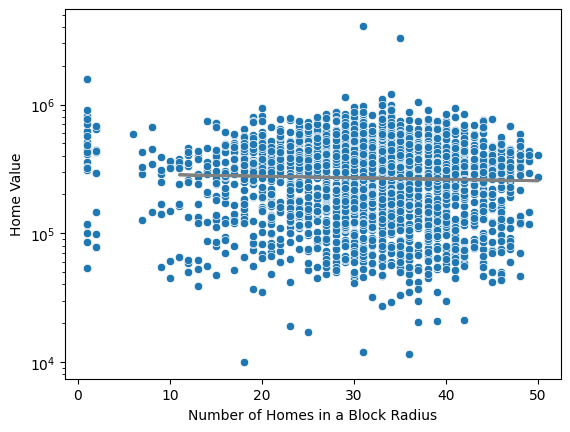

In [240]:
from scipy import stats

# sns.histplot(data=df_merged, x='density', bins=20)
sns.scatterplot(data=df_merged, x='density', y='home_value') # 0.001 is about 100 meters
plt.yscale('log')
plt.ylabel('Home Value')
plt.xlabel('Number of Homes in a Block Radius')

df_drop = df_merged.dropna(subset=['density','home_value'])
df_drop = df_drop[df_drop['density'] > 10]

x = df_drop['density']
y = np.log(df_drop['home_value'])
slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r, 2), 'p=', round(p, 3))

# Plot the regression line
plt.plot(x, np.exp(slope * x + intercept), color='gray', linewidth=2)

# No relationship between home density and home value

In [241]:
df_merged.columns

Index(['image', 'prediction', 'probability', 'pid', 'input', 'match',
       'property_id', 'latitude', 'longitude', 'search_url', 'image_url',
       'home_value', 'home_type', 'year_built', 'lot_size', 'price', 'beds',
       'baths', 'sqft', 'in_oak_park', 'unique_homes_in_radius', 'block',
       'simpson', 'bungalow', 'foursquare', 'prairie', 'victorian',
       'cumsum_year', 'density', 'unique_home_styles'],
      dtype='object')

In [420]:
df_drop

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,simpson,bungalow,foursquare,prairie,victorian,cumsum_year,density,unique_home_styles,rel_size,rel_sqft
4,732-S-Taylor-Ave_pid13252072.jpg,bungalow,0.923018,13252072,732 S TAYLOR AVE,732 S Taylor Ave,13252072,41.875122,-87.777870,/IL/Oak-Park/732-S-Taylor-Ave-60304/home/13252072,...,0.601562,True,False,False,False,574,44,2,0.511111,0.511111
5,1033-Highland-Ave_pid13251220.jpg,foursquare,0.542782,13251220,1033 HIGHLAND AVE,1033 Highland Ave,13251220,41.869637,-87.781930,/IL/Oak-Park/1033-Highland-Ave-60304/home/13251220,...,0.648438,False,True,False,False,276,41,3,0.221164,0.221164
7,932-S-Maple-Ave_pid13247032.jpg,prairie,0.756470,13247032,932 S MAPLE,932 S Maple Ave,13247032,41.871102,-87.803308,/IL/Oak-Park/932-S-Maple-Ave-60304/home/13247032,...,0.628099,False,False,True,False,621,15,3,0.158118,0.158118
8,710-S-Oak-Park-Ave_pid13248882.jpg,bungalow,0.501213,13248882,710 S OAK PARK AVE,710 S Oak Park Ave,13248882,41.875623,-87.793834,/IL/Oak-Park/710-S-Oak-Park-Ave-60304/home/13248882,...,0.743802,True,False,False,False,677,23,1,0.229524,0.229524
9,804-S-Scoville-Ave_pid13248076.jpg,bungalow,0.963835,13248076,804 SOUTH SCOVILLE,804 S Scoville Ave,13248076,41.874120,-87.787644,/IL/Oak-Park/804-S-Scoville-Ave-60304/home/13248076,...,0.710059,True,False,False,False,954,31,3,0.444444,0.444444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607,905-S-Kenilworth-Ave_pid13248007.jpg,foursquare,0.919932,13248007,905 S KENILWORTH,905 S Kenilworth Ave,13248007,41.872018,-87.796883,/IL/Oak-Park/905-S-Kenilworth-Ave-60304/home/13248007,...,0.500000,False,True,False,False,559,27,2,0.901173,0.901173
3611,715-S-Ridgeland-Ave_pid13249551.jpg,prairie,0.690543,13249551,715 S RIDGELAND,715 S Ridgeland Ave,13249551,41.875671,-87.784631,/IL/Oak-Park/715-S-Ridgeland-Ave-60304/home/13249551,...,0.640000,False,False,True,False,26,31,2,0.515873,0.515873
3618,746-S-Oak-Park-Ave_pid13248696.jpg,prairie,0.846088,13248696,746 S OAK PARK AVE,746 S Oak Park Ave,13248696,41.874404,-87.793769,/IL/Oak-Park/746-S-Oak-Park-Ave-60304/home/13248696,...,0.743802,False,False,True,False,563,16,2,0.571429,0.571429
3622,1001-S-East-Ave_pid13248562.jpg,prairie,0.981879,13248562,1001 S EAST AVE,1001 S East Ave,13248562,41.870594,-87.789304,/IL/Oak-Park/1001-S-East-Ave-60304/home/13248562,...,0.485207,False,False,True,False,557,24,2,0.539683,0.539683


In [428]:
# Look at interaction longitude and architectural style
# Does home value always increase as we move further from the city center?

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error

XVAR1 = ['latitude', 'longitude',
         'year_built',
         'beds', 'baths', 'sqft', 'lot_size',
         'unique_homes_in_radius', 'prediction', 'density', 'simpson',
         'probability']

# Remove rows with missing values
df_drop = df_merged.dropna(subset = XVAR1 + ['price'])
# df_drop = df_drop[df_drop['probability'] > 0.5]

# Split data into training and testing sets
X = df_drop[XVAR1]
y = df_drop['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

# Formula
MYVARS = [x for x in XVAR1 if x not in ['probability']]
formula = 'price ~ ' + " + ".join(MYVARS)

# Fit a generalized linear model
model1 = smf.glm(formula, data=df_train, family=sm.families.Gaussian(), var_weights=df_train['probability'])

fit1 = model1.fit()

fit1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  price   No. Observations:                  971
Model:                            GLM   Df Residuals:                      957
Model Family:                Gaussian   Df Model:                           13
Link Function:               Identity   Scale:                      7.4245e+09
Method:                          IRLS   Log-Likelihood:                -12571.
Date:                Fri, 18 Oct 2024   Deviance:                   7.1052e+12
Time:                        12:12:31   Pearson chi2:                 7.11e+12
No. Iterations:                     3   Pseudo R-squ. (CS):             0.8621
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                -4.826e+08   4.99e+07     -9.666      0.000    -5.8e+08   -3.85e+08
prediction[T.foursquare]  1.756e+04   8613.749      2.039      0.041     678.058    3.44e+04
prediction[T.prairie]     1.026e+04      1e+04      1.025      0.306   -9364.167    2.99e+04
prediction[T.victorian]   1.632e+04   8940.889      1.826      0.068   -1199.636    3.38e+04
latitude                  5.142e+06   7.49e+05      6.861      0.000    3.67e+06    6.61e+06
longitude                -3.038e+06   4.16e+05     -7.301      0.000   -3.85e+06   -2.22e+06
year_built                 332.1723    218.724      1.519      0.129     -96.518     760.863
beds                       1.56e+04   5310.338      2.937      0.003    5188.275     2.6e+04
baths                     5.942e+04   5215.686     11.393      0.000    4.92e+04    6.96e+04
sqft                       102.7209      6.667     15.407      0.000      89.654     115.788
lot_size                    -0.8573      2.748     -0.312      0.755      -6.243       4.529
unique_homes_in_radius    8692.4184   4731.456      1.837      0.066    -581.066     1.8e+04
density                   1254.8452    430.008      2.918      0.004     412.045    2097.646
simpson                  -1.255e+04   2.94e+04     -0.427      0.669   -7.01e+04     4.5e+04
============================================================================================
"""

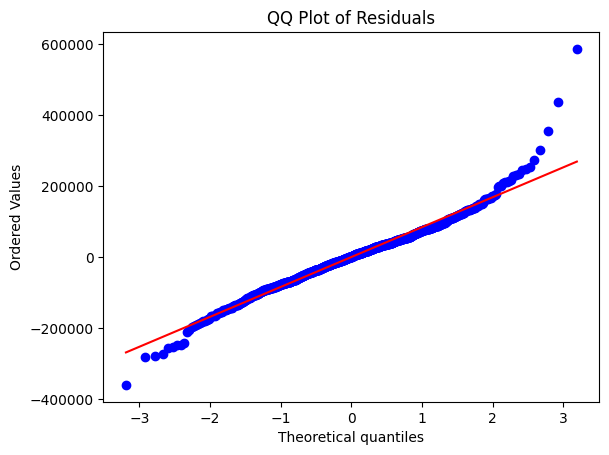

<Figure size 640x480 with 0 Axes>

In [429]:
# Generate a QQ plot to check normality of residuals
fig = plt.figure()
ax = fig.add_subplot(111)
stats.probplot(fit1.resid_pearson, dist="norm", plot=ax)
ax.set_title('QQ Plot of Residuals')
plt.show()
plt.savefig('reports/figures/qqplot_full_mod.png')

In [430]:
# predict from model
y_pred = fit1.predict(X_test[XVAR1])

# Calculate RMSE
rmse = root_mean_squared_error(y_test, y_pred)

# Average home price
avg_price = df_merged['price'].mean()

# Calculate Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Display results
print('RMSE = $', round(rmse, 2))
print('Average price = $', round(avg_price, 2))
print('MAPE =', round(mape, 2), "%")

RMSE = $ 90500.84
Average price = $ 437327.81
MAPE = 18.78 %


## Looking at Shap values...

In [485]:
from sklearn.linear_model import LinearRegression

MYVARS = [x for x in XVAR1 if x not in ['probability']]

# Split the data into training and testing sets
X = df_drop[MYVARS]
X = pd.get_dummies(X, columns = ['prediction'])
y = df_drop['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

model = LinearRegression()
model.fit(X_train, y_train)



LinearRegression()

In [524]:
import shap

# Create an explainer object
explainer = shap.LinearExplainer(model, X)

# Calculate SHAP values
shap_values = explainer(X_train)

# Make a waterfall plot
# shap.plots.waterfall(shap_values[25], max_display=20, show=False)

# fig, ax = plt.subplots()

# plt.figure(figsize=(10, 7))

shap.plots.waterfall(shap_values[25], max_display=20, show=False)

plt.gcf().set_size_inches(9, 7)

plt.savefig('reports/figures/shap_waterfall_plot.png', bbox_inches='tight')



In [431]:
# Model without home type (i.e., 'prediction' feature)

# Formula
XVAR2 = [x for x in XVAR1 if x not in ['prediction']]
formula = 'price ~ ' + " + ".join(XVAR2)

# Fit a generalized linear model
model2 = smf.glm(formula, data=df_train, family=sm.families.Gaussian())

fit2 = model2.fit()

print(fit2.summary())

# predict from model
y_pred = fit2.predict(X_test[XVAR2])
    
# Calculate RMSE
rmse = root_mean_squared_error(y_test, y_pred)

avg_price = df_merged['price'].mean()

print('RMSE = $', round(rmse, 2))
print('Average price = $', round(avg_price, 2))

# Calculate Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print('MAPE =', round(mape, 2), "%")




                 Generalized Linear Model Regression Results                  
Dep. Variable:                  price   No. Observations:                  971
Model:                            GLM   Df Residuals:                      959
Model Family:                Gaussian   Df Model:                           11
Link Function:               Identity   Scale:                      9.9634e+09
Method:                          IRLS   Log-Likelihood:                -12549.
Date:                Fri, 18 Oct 2024   Deviance:                   9.5549e+12
Time:                        12:12:50   Pearson chi2:                 9.55e+12
No. Iterations:                     3   Pseudo R-squ. (CS):             0.8458
Covariance Type:            nonrobust                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept              -4.70

In [416]:
# Compare likelihood ratios

# Calculate the likelihood ratio for each model
likelihood_ratio = 2 * (fit1.llf - fit2.llf)

# Print the results
print(f"Likelihood ratio for FULL vs REDUCED model: {likelihood_ratio}")

# Model with home type is ~5x better than model without home type


Likelihood ratio for FULL vs REDUCED model: 5.482693943180493


## Trying out random forest regression

In [397]:
# Random forest regression

XVARS = ['latitude','longitude','year_built','prediction','beds', 'baths', 'sqft', 'lot_size', 'density', 'simpson', 'unique_homes_in_radius']
YVAR = 'price'

# Drop rows with missing values
df_drop = df_merged.dropna(subset=XVARS+[YVAR])

# Split the data into training and testing sets
X = df_drop[XVARS]
X = pd.get_dummies(X, columns = ['prediction'])
y = df_drop[YVAR]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

# Fit the random forest model
regr = RandomForestRegressor(max_depth=10, min_samples_leaf=2, random_state=0)
regr.fit(X_train, y_train)

# Get the R^2 score (57% prediction accuracy)
print('R2 =', regr.score(X_test, y_test))

# Get predictions
y_pred = regr.predict(X_test)

# Calculate RMSE
rmse = root_mean_squared_error(y_test, y_pred)

avg_price = df_merged['price'].mean()

# Calculate Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print('Average price = $', round(avg_price, 2))
print('RMSE = $', round(rmse, 2))
print('MAPE =', round(mape, 2), '%')
# print('RMSE/Average price = ', 100*round(rmse/avg_price, 4), '%')


R2 = 0.6082354403992802
Average price = $ 437327.81
RMSE = $ 87996.28
MAPE = 18.81 %


In [398]:
# Fitting a RF without the simpson index

XVARS = ['latitude','longitude','year_built','beds', 'baths', 'sqft', 'lot_size']
YVAR = 'price'

# Drop rows with missing values
df_drop = df_merged.dropna(subset=XVARS+[YVAR])

# Split the data into training and testing sets
X = df_drop[XVARS]
# X = pd.get_dummies(X, columns = ['prediction'])
y = df_drop[YVAR]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

# Fit the random forest model
regr = RandomForestRegressor(max_depth=14, min_samples_split=0.02, random_state=0)
regr.fit(X_train, y_train)

# Get the R^2 score
print(regr.score(X_test, y_test))

# Get predictions
y_pred = regr.predict(X_test)

# Calculate RMSE
rmse = root_mean_squared_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

avg_price = df_merged['price'].mean()

print('Average price = $', round(avg_price, 2))
print('RMSE = $', round(rmse, 2))
print('MAPE =', round(mape, 2), '%')



0.6030323392540939
Average price = $ 437327.81
RMSE = $ 88578.7
MAPE = 18.79 %
